In [1]:
import pandas as pd

atlantic = pd.read_csv('atlantic.csv')
pacific = pd.read_csv('pacific.csv')

columns = []
for col_name in atlantic.columns: 
    columns.append(col_name)

atlantic_lite = atlantic.dropna()
pacific_lite = pacific.dropna()

atlantic_full = atlantic[atlantic['Moderate Wind NW'] != -999]
pacific_full = pacific[pacific['Moderate Wind NW'] != -999]

atlantic_place = atlantic
#atlantic_place['Latitude'] = atlantic_place['Latitude'].astype('|S')
print(atlantic_place.head())
atlantic_place = atlantic_place[atlantic_place['Latitude'].str[4] == 'N']
atlantic_place['Real Latitude'] = atlantic_place['Latitude']
atlantic_place.head()

         ID                 Name      Date  Time Event Status Latitude  \
0  AL011851              UNNAMED  18510625     0           HU    28.0N   
1  AL011851              UNNAMED  18510625   600           HU    28.0N   
2  AL011851              UNNAMED  18510625  1200           HU    28.0N   
3  AL011851              UNNAMED  18510625  1800           HU    28.1N   
4  AL011851              UNNAMED  18510625  2100     L     HU    28.2N   

  Longitude  Maximum Wind  Minimum Pressure  ...  Low Wind SW  Low Wind NW  \
0     94.8W            80              -999  ...         -999         -999   
1     95.4W            80              -999  ...         -999         -999   
2     96.0W            80              -999  ...         -999         -999   
3     96.5W            80              -999  ...         -999         -999   
4     96.8W            80              -999  ...         -999         -999   

   Moderate Wind NE  Moderate Wind SE  Moderate Wind SW  Moderate Wind NW  \
0        

C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/2022136120.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atlantic_place['Real Latitude'] = atlantic_place['Latitude']


,ID,Name,Date,Time,Event,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure,...,Low Wind NW,Moderate Wind NE,Moderate Wind SE,Moderate Wind SW,Moderate Wind NW,High Wind NE,High Wind SE,High Wind SW,High Wind NW,Real Latitude
0,AL011851,UNNAMED,18510625,0,,HU,28.0N,94.8W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.0N
1,AL011851,UNNAMED,18510625,600,,HU,28.0N,95.4W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.0N
2,AL011851,UNNAMED,18510625,1200,,HU,28.0N,96.0W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.0N
3,AL011851,UNNAMED,18510625,1800,,HU,28.1N,96.5W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.1N
4,AL011851,UNNAMED,18510625,2100,L,HU,28.2N,96.8W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.2N


In [2]:
atlantic_place.head()

,ID,Name,Date,Time,Event,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure,...,Low Wind NW,Moderate Wind NE,Moderate Wind SE,Moderate Wind SW,Moderate Wind NW,High Wind NE,High Wind SE,High Wind SW,High Wind NW,Real Latitude
0,AL011851,UNNAMED,18510625,0,,HU,28.0N,94.8W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.0N
1,AL011851,UNNAMED,18510625,600,,HU,28.0N,95.4W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.0N
2,AL011851,UNNAMED,18510625,1200,,HU,28.0N,96.0W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.0N
3,AL011851,UNNAMED,18510625,1800,,HU,28.1N,96.5W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.1N
4,AL011851,UNNAMED,18510625,2100,L,HU,28.2N,96.8W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,28.2N


In [3]:
#print(atlantic.head())
print(atlantic.shape)
print(atlantic_full.shape)

print(atlantic_lite.shape)

(49105, 22)
(5921, 22)
(49105, 22)


In [4]:
#print(pacific.head())
print(pacific.shape)
print(pacific_full.shape)

print(pacific_lite.shape)

(26137, 22)
(6387, 22)
(26137, 22)


In [5]:
print(atlantic['Latitude'].iloc[1])

28.0N


In [8]:
#Where useful stuff starts

def get_latitude(original_lat):
    
    hemisphere = original_lat[-1]
    lat = float(original_lat[:-1])
    
    if hemisphere == "S":
        lat = 0 - lat
        
    if abs(lat) > 90:
        lat = 0
        
    return lat
  

for i in range(60):
    print(atlantic['Latitude'].iloc[i])
    print(get_latitude(atlantic['Latitude'].iloc[i]))
    i += 1


28.0N
28.0
28.0N
28.0
28.0N
28.0
28.1N
28.1
28.2N
28.2
28.2N
28.2
28.3N
28.3
28.4N
28.4
28.6N
28.6
29.0N
29.0
29.5N
29.5
30.0N
30.0
30.5N
30.5
31.0N
31.0
22.2N
22.2
12.0N
12.0
13.4N
13.4
13.7N
13.7
14.0N
14.0
14.4N
14.4
14.9N
14.9
15.4N
15.4
15.9N
15.9
16.1N
16.1
16.6N
16.6
16.9N
16.9
17.2N
17.2
17.6N
17.6
18.0N
18.0
18.4N
18.4
18.9N
18.9
19.4N
19.4
19.9N
19.9
20.5N
20.5
21.2N
21.2
21.9N
21.9
22.6N
22.6
23.2N
23.2
23.9N
23.9
24.4N
24.4
25.0N
25.0
25.6N
25.6
26.2N
26.2
26.8N
26.8
27.4N
27.4
28.0N
28.0
28.5N
28.5
29.6N
29.6
30.1N
30.1
30.7N
30.7
31.6N
31.6
32.5N
32.5
33.4N
33.4
34.0N
34.0
34.8N
34.8
35.8N
35.8
36.8N
36.8
37.8N
37.8
38.9N
38.9
40.0N
40.0


In [7]:
def get_longitude(original_long):
    
    hemisphere = original_long[-1]
    long = float(original_long[:-1])
    
    if hemisphere == "W":
        long = 0 - long
        
    if abs(long) > 180:
        long = 0
        
    return long


def get_longitude2(original_long):
    
    hemisphere = original_long[-1]
    long = float(original_long[:-1])
    
    if hemisphere == "W":
        long = 180 + 180 - long

        
    #if abs(long) > 180:
        #long = 0
        
    return long


for i in range(60):
    print(atlantic['Longitude'].iloc[i])
    print(get_longitude(atlantic['Longitude'].iloc[i]))
    i += 1

94.8W
-94.8
95.4W
-95.4
96.0W
-96.0
96.5W
-96.5
96.8W
-96.8
97.0W
-97.0
97.6W
-97.6
98.3W
-98.3
98.9W
-98.9
99.4W
-99.4
99.8W
-99.8
100.0W
-100.0
100.1W
-100.1
100.2W
-100.2
97.6W
-97.6
60.0W
-60.0
48.0W
-48.0
49.5W
-49.5
51.0W
-51.0
52.8W
-52.8
54.6W
-54.6
56.5W
-56.5
58.5W
-58.5
60.4W
-60.4
62.5W
-62.5
64.1W
-64.1
66.0W
-66.0
67.6W
-67.6
69.3W
-69.3
71.1W
-71.1
72.6W
-72.6
74.3W
-74.3
75.9W
-75.9
77.6W
-77.6
79.0W
-79.0
80.4W
-80.4
81.4W
-81.4
82.5W
-82.5
83.6W
-83.6
84.3W
-84.3
84.9W
-84.9
85.5W
-85.5
86.0W
-86.0
86.3W
-86.3
86.5W
-86.5
86.6W
-86.6
86.6W
-86.6
86.1W
-86.1
85.7W
-85.7
85.1W
-85.1
84.1W
-84.1
83.0W
-83.0
81.4W
-81.4
80.0W
-80.0
78.6W
-78.6
77.0W
-77.0
75.1W
-75.1
73.6W
-73.6
71.8W
-71.8
70.0W
-70.0


In [8]:
atlantic["Real Latitude"] = 0
atlantic["Real Longitude"] = 0

for i in range(atlantic.shape[0]):
    atlantic["Real Latitude"][i] = get_latitude((atlantic['Latitude'].iloc[i]))

for i in range(atlantic.shape[0]):
    atlantic["Real Longitude"][i] = get_longitude((atlantic['Longitude'].iloc[i]))


atlantic.head()


C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/2375131741.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atlantic["Real Latitude"][i] = get_latitude((atlantic['Latitude'].iloc[i]))
C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/2375131741.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  atlantic["Real Longitude"][i] = get_longitude((atlantic['Longitude'].iloc[i]))


,ID,Name,Date,Time,Event,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure,...,Moderate Wind NE,Moderate Wind SE,Moderate Wind SW,Moderate Wind NW,High Wind NE,High Wind SE,High Wind SW,High Wind NW,Real Latitude,Real Longitude
0,AL011851,UNNAMED,18510625,0,,HU,28.0N,94.8W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,28,-94
1,AL011851,UNNAMED,18510625,600,,HU,28.0N,95.4W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,28,-95
2,AL011851,UNNAMED,18510625,1200,,HU,28.0N,96.0W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,28,-96
3,AL011851,UNNAMED,18510625,1800,,HU,28.1N,96.5W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,28,-96
4,AL011851,UNNAMED,18510625,2100,L,HU,28.2N,96.8W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,28,-96


In [9]:
pacific["Real Latitude"] = 0
pacific["Real Longitude"] = 0

for i in range(pacific.shape[0]):
    pacific["Real Latitude"][i] = get_latitude((pacific['Latitude'].iloc[i]))

for i in range(pacific.shape[0]):
    pacific["Real Longitude"][i] = get_longitude((pacific['Longitude'].iloc[i]))


pacific.head()

C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/301692872.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pacific["Real Latitude"][i] = get_latitude((pacific['Latitude'].iloc[i]))
C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/301692872.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pacific["Real Longitude"][i] = get_longitude((pacific['Longitude'].iloc[i]))


,ID,Name,Date,Time,Event,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure,...,Moderate Wind NE,Moderate Wind SE,Moderate Wind SW,Moderate Wind NW,High Wind NE,High Wind SE,High Wind SW,High Wind NW,Real Latitude,Real Longitude
0,EP011949,UNNAMED,19490611,0,,TS,20.2N,106.3W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,20,-106
1,EP011949,UNNAMED,19490611,600,,TS,20.2N,106.4W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,20,-106
2,EP011949,UNNAMED,19490611,1200,,TS,20.2N,106.7W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,20,-106
3,EP011949,UNNAMED,19490611,1800,,TS,20.3N,107.7W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,20,-107
4,EP011949,UNNAMED,19490612,0,,TS,20.4N,108.6W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,20,-108


In [10]:
#gonna try to visualize where they be

import seaborn
from matplotlib import pyplot as plt


plt.gcf().set_size_inches((20, 20)) 
seaborn.scatterplot(atlantic['Real Longitude'],atlantic['Real Latitude'], hue=atlantic['Maximum Wind'])

KeyError: 'Real Longitude'

<Figure size 1440x1440 with 0 Axes>

C:\Users\solmann\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Real Longitude', ylabel='Real Latitude'>

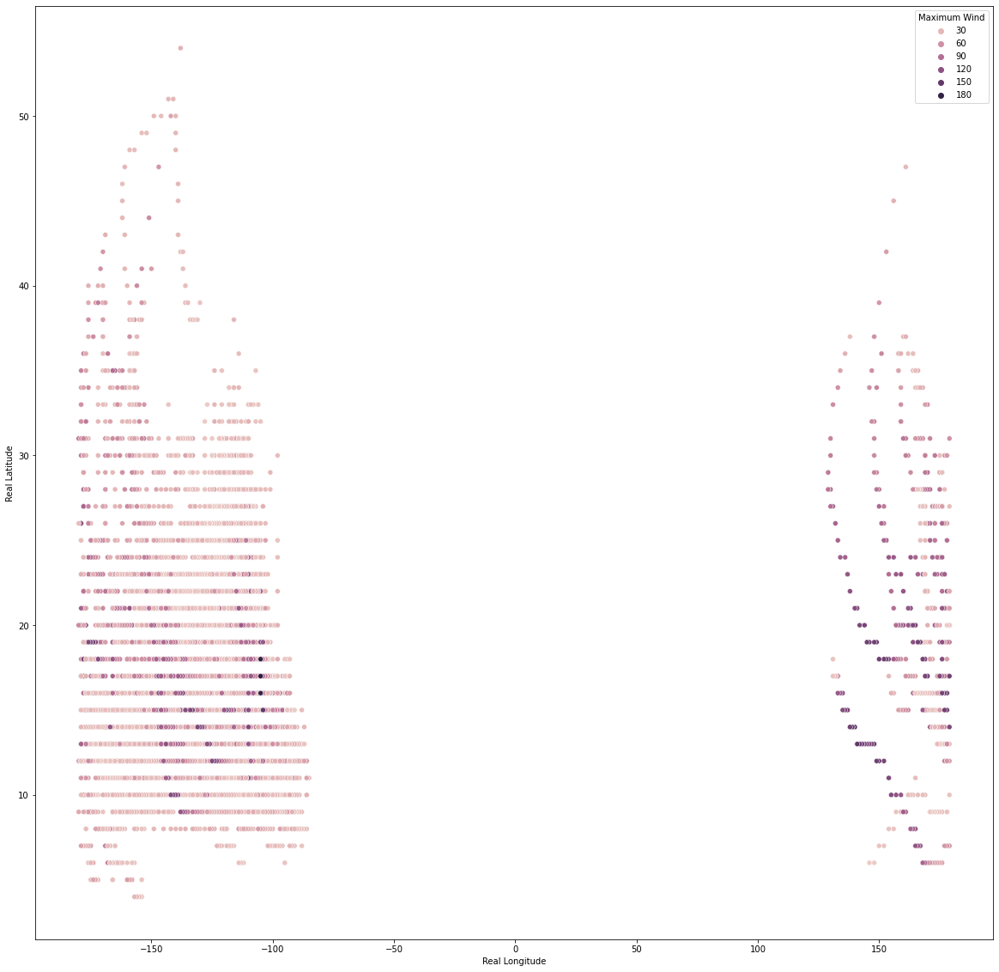

In [11]:
plt.gcf().set_size_inches((20, 20)) 
seaborn.scatterplot(pacific['Real Longitude'],pacific['Real Latitude'], hue=pacific['Maximum Wind'])

In [12]:
print(atlantic.Date.iloc[0])
print(int(str(atlantic.Date.iloc[0])[0:4]))

18510625
1851


In [13]:
def visualize_years(dataset, start, end, ocean):
    dataset['year'] = 0
    
    for i in range(dataset.shape[0]):
        dataset['year'][i] = int(str(dataset.iloc[i].Date)[0:4])
        
    
    dataset2 = dataset[(dataset['year'] >= start) & (dataset['year'] <= end)]
    
    #plt.gcf().set_size_inches((40, 20)) 
    fig, ax = plt.subplots(figsize=(40,20))
    
    if ocean == 'atlantic':
        plt.xlim(-180, 180)
        plt.ylim(-90, 90)
    #else:
        #plt.xlim(0,360)
        #plt.ylim(-90,90)
    
    img = plt.imread("Blue_Marble_2002.png")
    #ax.imshow(img)
    
    seaborn.scatterplot(dataset2['Real Longitude'],dataset2['Real Latitude'], hue=dataset2['Maximum Wind'], ax=ax)
    ax.imshow(img, extent=[-180, 180, -90, 90], aspect='auto')

In [5]:
def visualize(dataset, ocean):
    
    dataset["Real Latitude"] = 0
    dataset["Real Longitude"] = 0

    for i in range(dataset.shape[0]):
        dataset["Real Latitude"][i] = get_latitude((dataset['Latitude'].iloc[i]))

    for i in range(dataset.shape[0]):
        dataset["Real Longitude"][i] = get_longitude((dataset['Longitude'].iloc[i]))
    
    fig, ax = plt.subplots(figsize=(40,20))
    
    if ocean == 'atlantic':
        plt.xlim(-180, 180)
        plt.ylim(-90, 90)
    #else:
        #plt.xlim(0,360)
        #plt.ylim(-90,90)
    
    img = plt.imread("Blue_Marble_2002.png")
    #ax.imshow(img)
    
    seaborn.scatterplot(dataset['Real Longitude'],dataset['Real Latitude'], hue=dataset['Maximum Wind'], ax=ax)
    ax.imshow(img, extent=[-180, 180, -90, 90], aspect='auto')
    
    
    
def get_timeframe(dataset, start, end):
    dataset['year'] = 0
    
    for i in range(dataset.shape[0]):
        dataset['year'][i] = int(str(dataset.iloc[i].Date)[0:4])
        
    
    dataset2 = dataset[(dataset['year'] >= start) & (dataset['year'] <= end)]
    
    return dataset2

In [65]:
def visualize_event(dataset, event, ocean):
    
    for i in range(dataset.shape[0]):
        dataset['Event'][i] = dataset['Event'][i].strip()
   
    dataset2 = dataset[dataset['Event'] == event]
    
    visualize(dataset2, ocean)
    
def visualize_status(dataset, status, ocean):
    
    for i in range(dataset.shape[0]):
        dataset['Status'][i] = dataset['Status'][i].strip()
    
    dataset2 = dataset[dataset['Status'] == status]
    
    visualize(dataset2, ocean)
    


C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/1488359768.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['year'][i] = int(str(dataset.iloc[i].Date)[0:4])
C:\Users\solmann\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


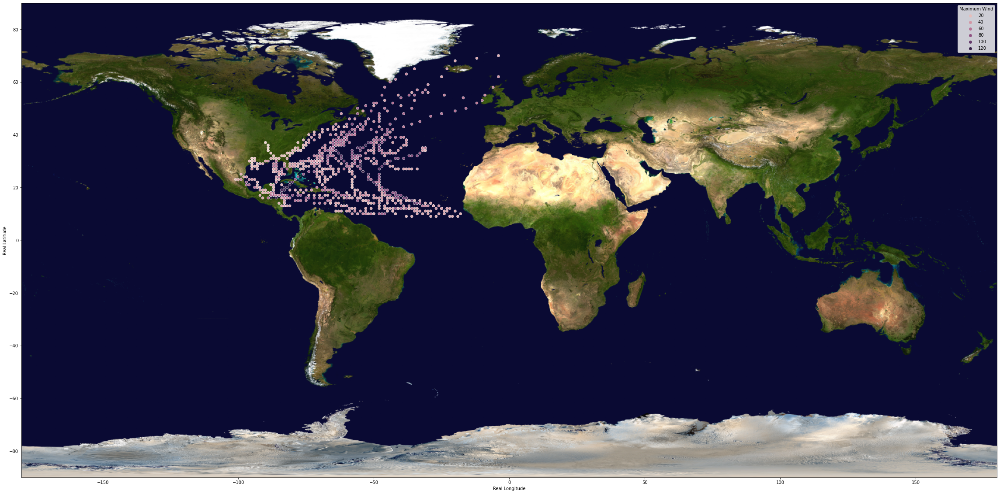

In [15]:
visualize_years(atlantic, 2000, 2001, 'atlantic')


C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/1488359768.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['year'][i] = int(str(dataset.iloc[i].Date)[0:4])


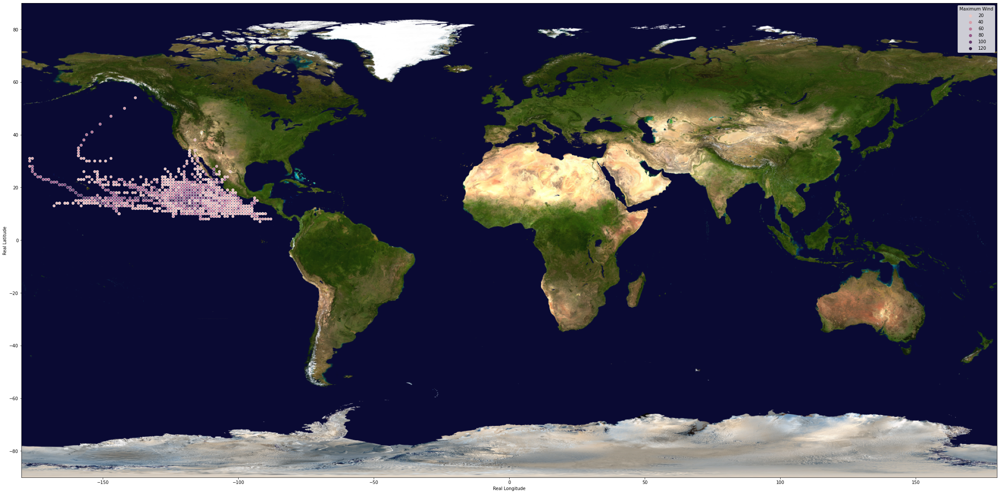

In [26]:
visualize_years(pacific, 1975, 1980, 'pacific')

C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/2164199846.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['Event'][i] = dataset['Event'][i].strip()
C:\Users\solmann\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


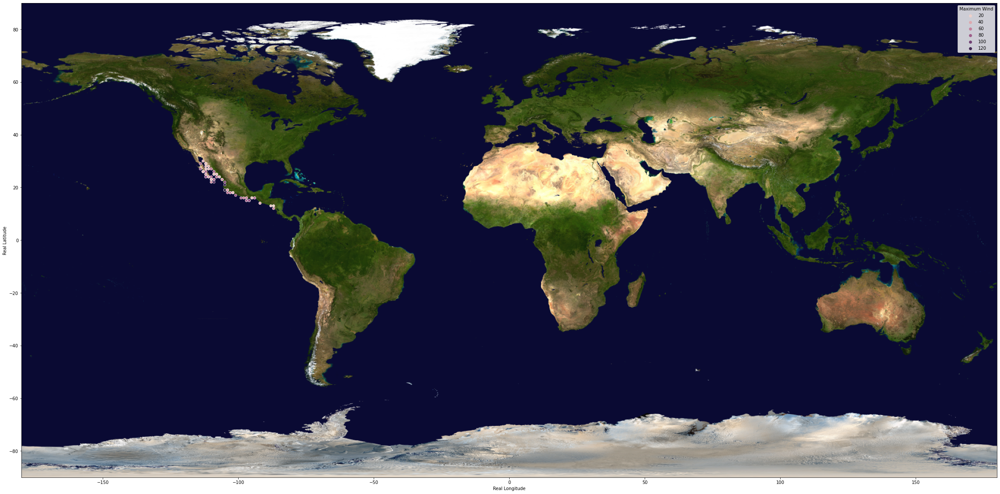

In [67]:
visualize_event(pacific, 'L', 'atlantic')

C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/2164199846.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['Status'][i] = dataset['Status'][i].strip()
C:\Users\solmann\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


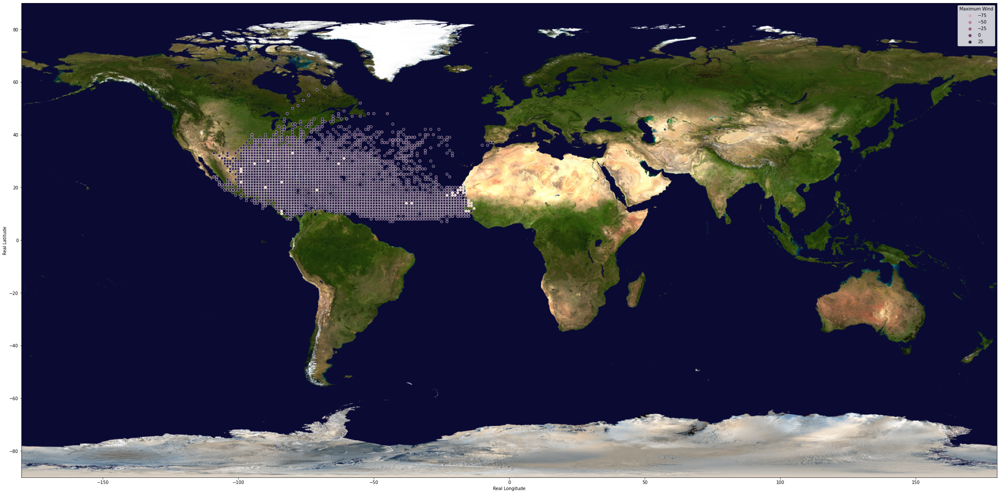

In [72]:
'''atlantic2 = atlantic
atlantic2['year'] = 0
    
for i in range(atlantic2.shape[0]):
    atlantic2['year'][i] = int(str(atlantic2.iloc[i].Date)[0:4])
        
atlantic_2000 = atlantic2[atlantic2['year'] >= 2000]
'''
visualize_status(atlantic, 'TD', 'atlantic')

C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/3681916192.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['year'][i] = int(str(dataset.iloc[i].Date)[0:4])
C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/3681916192.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset["Real Latitude"] = 0
C:\Users\solmann\AppData\Local\Temp/ipykernel_5512/3681916192.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

KeyError: 0

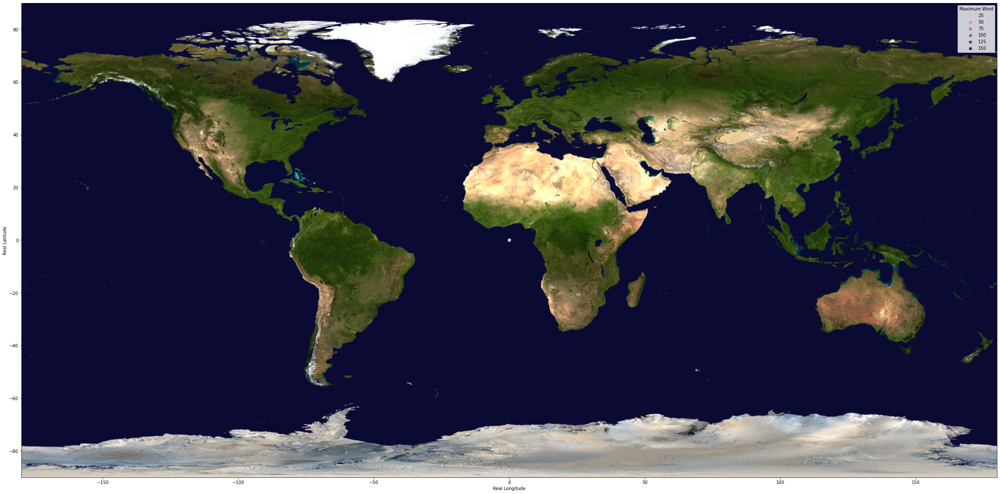

In [81]:
atlantic_20002010 = get_timeframe(atlantic, 2000, 2010)

visualize(atlantic_20002010, 'atlantic')
visualize_event(atlantic_20002010, 'L', 'atlantic')
visualize_status(atlantic_20002010, 'TD', 'atlantic')

In [3]:
pacific_2 = pacific.drop_duplicates(subset = ["ID"])
pacific_2.head()

,ID,Name,Date,Time,Event,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure,...,Low Wind SW,Low Wind NW,Moderate Wind NE,Moderate Wind SE,Moderate Wind SW,Moderate Wind NW,High Wind NE,High Wind SE,High Wind SW,High Wind NW
0,EP011949,UNNAMED,19490611,0,,TS,20.2N,106.3W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
7,EP021949,UNNAMED,19490617,1200,,TS,14.1N,107.0W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
32,EP031949,UNNAMED,19490903,1200,,TS,17.3N,106.3W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
57,EP041949,UNNAMED,19490909,1200,,HU,19.3N,108.6W,75,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
66,EP051949,UNNAMED,19490917,1200,,TS,15.4N,101.3W,45,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999


C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/3681916192.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset["Real Latitude"] = 0
C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/3681916192.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset["Real Longitude"] = 0
C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/3681916192.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/p

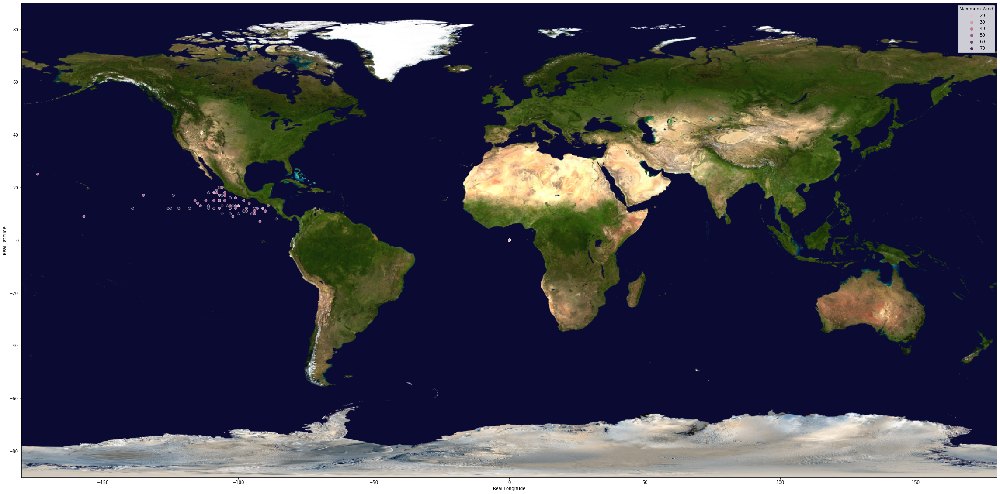

In [11]:
visualize(pacific_2, 'atlantic')

In [12]:
atlantic_2 = atlantic.drop_duplicates(subset = ["ID"])
atlantic_2.head()

,ID,Name,Date,Time,Event,Status,Latitude,Longitude,Maximum Wind,Minimum Pressure,...,Low Wind SW,Low Wind NW,Moderate Wind NE,Moderate Wind SE,Moderate Wind SW,Moderate Wind NW,High Wind NE,High Wind SE,High Wind SW,High Wind NW
0,AL011851,UNNAMED,18510625,0,,HU,28.0N,94.8W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
14,AL021851,UNNAMED,18510705,1200,,HU,22.2N,97.6W,80,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
15,AL031851,UNNAMED,18510710,1200,,TS,12.0N,60.0W,50,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
16,AL041851,UNNAMED,18510816,0,,TS,13.4N,48.0W,40,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999
65,AL051851,UNNAMED,18510913,0,,TS,32.5N,73.5W,50,-999,...,-999,-999,-999,-999,-999,-999,-999,-999,-999,-999


C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/3681916192.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset["Real Latitude"] = 0
C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/3681916192.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset["Real Longitude"] = 0
C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/3681916192.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/p

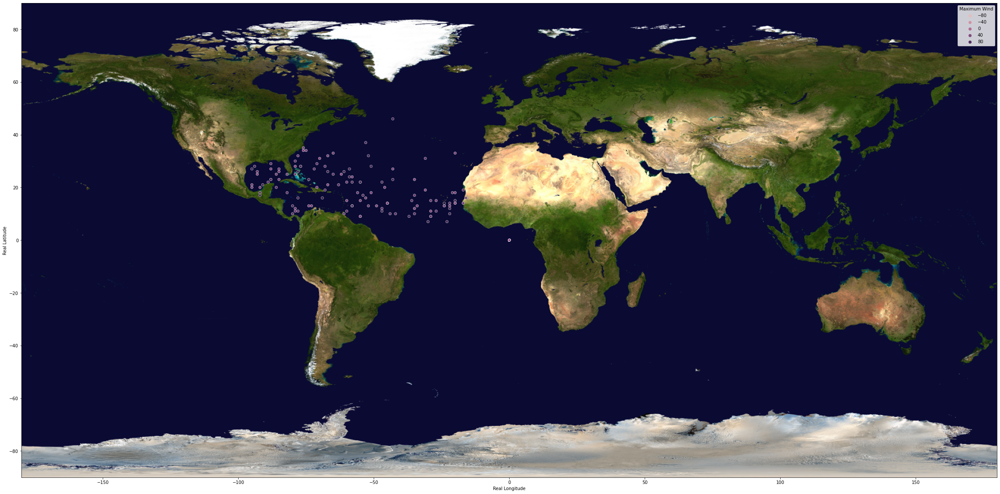

In [14]:
visualize(atlantic_2, 'atlantic')

C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/2133345468.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pacific_2['year'] = 0
C:\Users\solmann\AppData\Local\Temp/ipykernel_4792/2133345468.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pacific_2['year'][i] = int(str(pacific_2.iloc[i].Date)[0:4])
C:\Users\solmann\anaconda3\lib\site-packages\pandas\core\indexing.py:1724: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

Years: 1949  -  3
Years: 1954  -  4
Years: 1959  -  3
Years: 1964  -  4
Years: 1969  -  5
Years: 1974  -  5
Years: 1979  -  6
Years: 1984  -  6
Years: 1989  -  5
Years: 1994  -  5
Years: 1999  -  8
Years: 2004  -  8
Years: 2009  -  2
Years: 2014  -  1
[(45.0, '1949 - 1953'), (55.0, '1954 - 1958'), (58.333333333333336, '1959 - 1963'), (60.0, '1964 - 1968'), (51.0, '1969 - 1973'), (51.0, '1974 - 1978'), (60.0, '1979 - 1983'), (60.0, '1984 - 1988'), (51.0, '1989 - 1993'), (63.0, '1994 - 1998'), (60.0, '1999 - 2003'), (63.75, '2004 - 2008'), (62.5, '2009 - 2013'), (25.0, '2014 - 2018')]


C:\Users\solmann\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


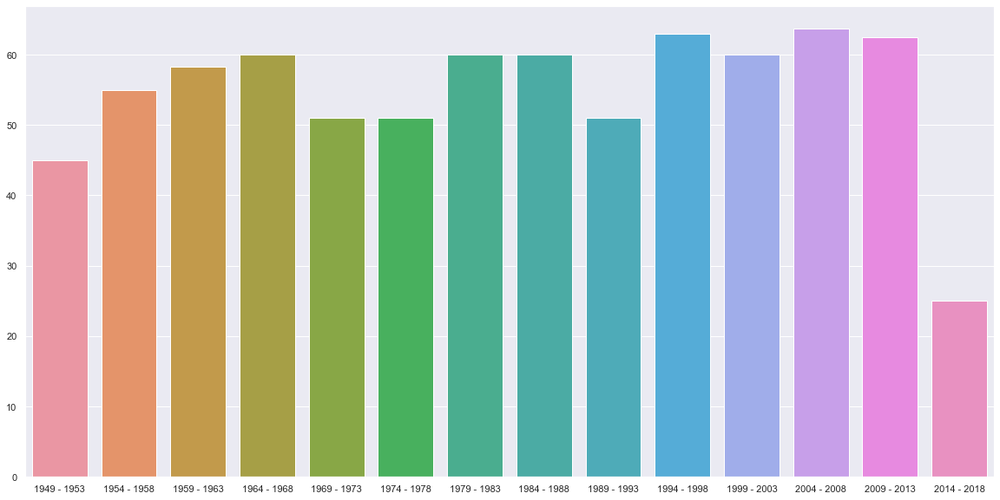

In [67]:
import seaborn as sns
import numpy

pacific_2 = pacific.drop_duplicates(subset = ["ID"])

pacific_2['year'] = 0
    
for i in range(pacific_2.shape[0]):
        pacific_2['year'][i] = int(str(pacific_2.iloc[i].Date)[0:4])
        
wind = []
years = []

i = 1949
while i < 2016:
    pacific_3 = pacific_2[(pacific_2['year'] >= i) & (pacific_2['year'] < (i + 5))]
    wind.append(pacific_3["Maximum Wind"].mean())
    years.append(str(i) + " - " + str(i + 4))
    #datasets.append(pacific_3)
    print("Years: " + str(i) + "  -  " + str(pacific_3.shape[0]))
    i += 5

new = list(zip(wind, years))
wind = numpy.array(wind)
years = numpy.array(years)

print(new)

#fig, ax = plt.subplots()
#figsize=(18, 9)
#pacific_2[pacific_2["year"] != 0]
sns.set(rc={'figure.figsize':(20,10)})
sns.barplot(years.T, wind.T)
#plt.plot(years.T, wind.T)
#ax.set_xlim(left=1949, right=2015)
plt.show()